In [7]:
# Importing the required libraries
import pandas as pd
import numpy as np

In [8]:
df = pd.read_csv('/Users/300013714/upgrad_decision_tree/datasets/heart_disease_case_study.csv',sep=';')

In [9]:
df.head()

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,0,18393,2,168,62.0,110,80,1,1,0,0,1,0
1,1,20228,1,156,85.0,140,90,3,1,0,0,1,1
2,2,18857,1,165,64.0,130,70,3,1,0,0,0,1
3,3,17623,2,169,82.0,150,100,1,1,0,0,1,1
4,4,17474,1,156,56.0,100,60,1,1,0,0,0,0


In [10]:
df.shape

(70000, 13)

In [11]:
df.columns

Index(['id', 'age', 'gender', 'height', 'weight', 'ap_hi', 'ap_lo',
       'cholesterol', 'gluc', 'smoke', 'alco', 'active', 'cardio'],
      dtype='object')

In [12]:
df.describe()

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
count,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000
mean,49972.419900,19468.865814,1.349571,164.359229,74.205690,128.817286,96.630414,1.366871,1.226457,0.088129,0.053771,0.803729,0.499700
std,28851.302323,2467.251667,0.476838,8.210126,14.395757,154.011419,188.472530,0.680250,0.572270,0.283484,0.225568,0.397179,0.500003
min,0.000000,10798.000000,1.000000,55.000000,10.000000,-150.000000,-70.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,25006.750000,17664.000000,1.000000,159.000000,65.000000,120.000000,80.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000
50%,50001.500000,19703.000000,1.000000,165.000000,72.000000,120.000000,80.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000
75%,74889.250000,21327.000000,2.000000,170.000000,82.000000,140.000000,90.000000,2.000000,1.000000,0.000000,0.000000,1.000000,1.000000
max,99999.000000,23713.000000,2.000000,250.000000,200.000000,16020.000000,11000.000000,3.000000,3.000000,1.000000,1.000000,1.000000,1.000000


In [14]:
df['cardio'].value_counts()

0    35021
1    34979
Name: cardio, dtype: int64

In [15]:
y = df['cardio']

In [17]:
x = df.drop('cardio',axis=1)

In [21]:
x.head()

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active
0,0,18393,2,168,62.0,110,80,1,1,0,0,1
1,1,20228,1,156,85.0,140,90,3,1,0,0,1
2,2,18857,1,165,64.0,130,70,3,1,0,0,0
3,3,17623,2,169,82.0,150,100,1,1,0,0,1
4,4,17474,1,156,56.0,100,60,1,1,0,0,0


## Train a simple Decision tree model

In [23]:
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, confusion_matrix
from sklearn import metrics

In [24]:
x_train, x_test, y_train, y_test = train_test_split(x,y,test_size=0.2, random_state=0)

In [25]:
x_train.shape

(56000, 12)

In [26]:
x_test.shape

(14000, 12)

In [35]:
x_test.head()

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active
10840,15505,15216,1,165,61.0,120,80,1,1,0,0,1
56267,80282,19815,1,164,54.0,110,80,1,1,0,0,1
14849,21224,20563,1,170,69.0,120,80,1,1,0,0,1
62726,89571,16625,1,167,57.0,110,70,1,1,0,0,1
47180,67392,14451,1,158,110.0,120,80,1,1,0,0,0


In [27]:
x.shape

(70000, 12)

In [143]:
dt_basic = DecisionTreeClassifier()

In [144]:
dt_basic

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

In [145]:
dt_basic.fit(x_train,y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

In [146]:
y_preds = dt_basic.predict(x_test)

In [147]:
y_preds

array([0, 0, 0, ..., 1, 0, 1])

In [148]:
accuracy_value = metrics.accuracy_score(y_test, y_preds)

In [149]:
accuracy_value

0.6374285714285715

In [150]:
confusion_matrix(y_test, y_preds)

array([[4504, 2565],
       [2511, 4420]])

In [151]:
print(classification_report(y_test, y_preds))

              precision    recall  f1-score   support

           0       0.64      0.64      0.64      7069
           1       0.63      0.64      0.64      6931

    accuracy                           0.64     14000
   macro avg       0.64      0.64      0.64     14000
weighted avg       0.64      0.64      0.64     14000



In [152]:
dt_basic.tree_.node_count

26535

## Visualize the Tree

In [111]:
from IPython.display import Image  
from sklearn.externals.six import StringIO  
from sklearn.tree import export_graphviz
import pydotplus, graphviz

In [112]:
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [113]:
features = list(x.columns[0:])

In [114]:
features

['id',
 'age',
 'gender',
 'height',
 'weight',
 'ap_hi',
 'ap_lo',
 'cholesterol',
 'gluc',
 'smoke',
 'alco',
 'active']

In [115]:
dot_data = StringIO()

In [116]:
export_graphviz(dt_basic, out_file=dot_data, feature_names=features, filled=True, rounded=True)

In [117]:
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())

In [118]:
Image(graph.create_png())

In [ ]:
dot_data = StringIO()
export_graphviz(dt_basic, out_file=dot_data, feature_names=features, filled=True, rounded=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

## Hyperparamter Tuning Optimization 

### Max_depth

In [119]:
parameters = {'max_depth': range(1,10)}

In [120]:
parameters

{'max_depth': range(1, 10)}

In [121]:
n_folds = 5

In [122]:
dtree = DecisionTreeClassifier(criterion='gini', random_state=0)

In [123]:
dtree

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=0, splitter='best')

In [124]:
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV

In [125]:
tree = GridSearchCV(dtree, parameters, cv=n_folds, scoring="accuracy", return_train_score=True)

In [126]:
tree

GridSearchCV(cv=5, error_score=nan,
             estimator=DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort='deprecated',
                                              random_state=0, splitter='best'),
             iid='deprecated', n_jobs=None,
             param_grid={'max_depth': range(1, 10)}, pre_dispatch='2*n_jobs',
             refit=True, return_train_score=True,

In [127]:
tree.fit(x_train, y_train)

GridSearchCV(cv=5, error_score=nan,
             estimator=DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort='deprecated',
                                              random_state=0, splitter='best'),
             iid='deprecated', n_jobs=None,
             param_grid={'max_depth': range(1, 10)}, pre_dispatch='2*n_jobs',
             refit=True, return_train_score=True,

In [128]:
scores = tree.cv_results_

In [153]:
#scores

In [130]:
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.033536,0.007075,0.003108,0.000421,1,{'max_depth': 1},0.711607,0.718839,0.708661,0.711875,...,0.713946,0.004116,8,0.714531,0.712723,0.715268,0.714464,0.712746,0.713946,0.001029
1,0.047108,0.002447,0.003266,0.000595,2,{'max_depth': 2},0.711607,0.718839,0.708661,0.711875,...,0.713946,0.004116,8,0.714531,0.712723,0.715268,0.714464,0.712746,0.713946,0.001029
2,0.066758,0.000949,0.003280,0.000243,3,{'max_depth': 3},0.724375,0.731071,0.719554,0.726696,...,0.725875,0.003825,7,0.726250,0.724576,0.727455,0.725670,0.725424,0.725875,0.000956
3,0.086456,0.004027,0.003781,0.000564,4,{'max_depth': 4},0.730625,0.731161,0.724911,0.727589,...,0.729250,0.002627,3,0.731830,0.729688,0.732098,0.730402,0.729308,0.730665,0.001121
4,0.109239,0.009939,0.003600,0.000585,5,{'max_depth': 5},0.727679,0.734464,0.726696,0.727500,...,0.729786,0.003129,2,0.733080,0.733371,0.735558,0.735558,0.733080,0.734129,0.001171


In [138]:
scores["param_max_depth"]

masked_array(data=[1, 2, 3, 4, 5, 6, 7, 8, 9],
             mask=[False, False, False, False, False, False, False, False,
                   False],
       fill_value='?',
            dtype=object)

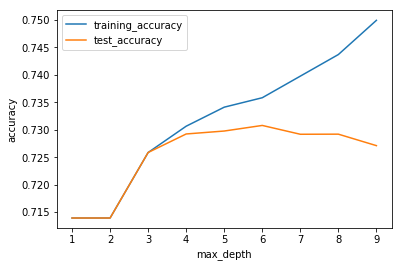

In [141]:
plt.figure
plt.plot(scores["param_max_depth"].data, scores["mean_train_score"], label="training_accuracy")
plt.plot(scores["param_max_depth"].data, scores["mean_test_score"], label="test_accuracy")
plt.xlabel("max_depth")
plt.ylabel("accuracy")
plt.legend()
plt.show()


In [142]:
tree.best_params_

{'max_depth': 6}

### Min_samples_leaf

In [175]:
parameters = {'min_samples_leaf': range(10,200,20)}

In [176]:
dtree = DecisionTreeClassifier(criterion='gini', random_state=0)

In [177]:
n_folds = 5

In [178]:
tree2 = GridSearchCV(dtree, parameters, cv=n_folds, scoring="accuracy", return_train_score=True)

In [179]:
tree2.fit(x_train, y_train)

GridSearchCV(cv=5, error_score=nan,
             estimator=DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort='deprecated',
                                              random_state=0, splitter='best'),
             iid='deprecated', n_jobs=None,
             param_grid={'min_samples_leaf': range(10, 200, 20)},
             pre_dispatch='2*n_jobs', refit=True, return_trai

In [180]:
scores2 = tree2.cv_results_

In [182]:
#scores2

In [184]:
pd.DataFrame(scores2).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.297673,0.012326,0.005987,0.000863,10,{'min_samples_leaf': 10},0.684107,0.680268,0.683125,0.675804,...,0.679500,0.003918,10,0.803839,0.803080,0.802210,0.804554,0.802813,0.803299,0.000817
1,0.257469,0.014015,0.004368,0.000345,30,{'min_samples_leaf': 30},0.719911,0.720000,0.716339,0.714375,...,0.716857,0.002678,9,0.759665,0.760112,0.759978,0.761228,0.760335,0.760263,0.000529
2,0.225454,0.007762,0.004316,0.000255,50,{'min_samples_leaf': 50},0.723661,0.727232,0.723214,0.723304,...,0.724571,0.001557,8,0.750915,0.750379,0.751138,0.751652,0.752009,0.751219,0.000568
3,0.205830,0.005787,0.004173,0.000480,70,{'min_samples_leaf': 70},0.724821,0.730179,0.721786,0.728304,...,0.725911,0.002974,7,0.746071,0.746607,0.747299,0.748705,0.746652,0.747067,0.000907
4,0.198921,0.004005,0.004213,0.000318,90,{'min_samples_leaf': 90},0.729107,0.733661,0.722054,0.729286,...,0.728625,0.003725,6,0.744040,0.743571,0.745313,0.745335,0.743259,0.744304,0.000869


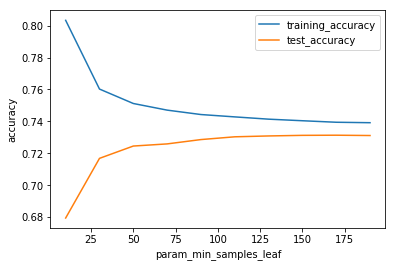

In [187]:
plt.figure
plt.plot(scores2["param_min_samples_leaf"].data, scores2["mean_train_score"], label="training_accuracy")
plt.plot(scores2["param_min_samples_leaf"].data, scores2["mean_test_score"], label="test_accuracy")
plt.xlabel("param_min_samples_leaf")
plt.ylabel("accuracy")
plt.legend()
plt.show()


In [188]:
tree2.best_params_

{'min_samples_leaf': 170}

### Parameter Grid to test multiple Hyperparameters

In [189]:
param_grid = {
    'max_depth' : range(5,15,5),
    'min_samples_leaf': range(50,150,50),
    'min_samples_split': range(50,150,50),
    'criterion' : ['gini','entropy']
}

In [190]:
param_grid

{'max_depth': range(5, 15, 5),
 'min_samples_leaf': range(50, 150, 50),
 'min_samples_split': range(50, 150, 50),
 'criterion': ['gini', 'entropy']}

In [191]:
n_folds=5

In [192]:
dtree=DecisionTreeClassifier()

In [193]:
dtree

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

In [199]:
grid = GridSearchCV(dtree, param_grid, cv=n_folds, n_jobs=-1, return_train_score=True)

In [200]:
grid.fit(x_train, y_train)

GridSearchCV(cv=5, error_score=nan,
             estimator=DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort='deprecated',
                                              random_state=None,
                                              splitter='best'),
             iid='deprecated', n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                     

In [201]:
grid.cv_results_

{'mean_fit_time': array([0.27856164, 0.2216897 , 0.26544232, 0.29649267, 0.55813942,
        0.46319661, 0.34712234, 0.34572082, 0.23482227, 0.24247351,
        0.25019312, 0.24866509, 0.45269938, 0.53456998, 0.59981666,
        0.26883874]),
 'std_fit_time': array([0.04721202, 0.02020541, 0.04704598, 0.02572799, 0.02654549,
        0.07468427, 0.00944367, 0.0120509 , 0.02773411, 0.01800424,
        0.02742389, 0.00962539, 0.01163115, 0.12138849, 0.06490755,
        0.07708424]),
 'mean_score_time': array([0.010185  , 0.00809002, 0.01475921, 0.01046853, 0.01204638,
        0.01103535, 0.0093297 , 0.01004038, 0.00890031, 0.00960646,
        0.0092    , 0.0085988 , 0.01091943, 0.00902948, 0.00820241,
        0.00452485]),
 'std_score_time': array([0.00067705, 0.00357824, 0.00873953, 0.00191567, 0.00404067,
        0.00381971, 0.00267245, 0.00620137, 0.00201795, 0.00222484,
        0.00277895, 0.00145935, 0.00610911, 0.00260696, 0.00209807,
        0.00085995]),
 'param_criterion': masked

In [202]:
cv_result = pd.DataFrame(grid.cv_results_)

In [204]:
cv_result.head(2)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_min_samples_leaf,param_min_samples_split,params,split0_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.278562,0.047212,0.010185,0.000677,gini,5,50,50,"{'criterion': 'gini', 'max_depth': 5, 'min_sam...",0.728036,...,0.729946,0.00308,9,0.732679,0.733147,0.73529,0.735246,0.73279,0.73383,0.001184
1,0.221690,0.020205,0.008090,0.003578,gini,5,50,100,"{'criterion': 'gini', 'max_depth': 5, 'min_sam...",0.728036,...,0.729946,0.00308,9,0.732679,0.733147,0.73529,0.735246,0.73279,0.73383,0.001184


In [205]:
grid.best_params_

{'criterion': 'gini',
 'max_depth': 10,
 'min_samples_leaf': 100,
 'min_samples_split': 50}

In [206]:
grid.best_score_

0.7314107142857142

In [210]:
best_grid = grid.best_estimator_

In [211]:
best_grid

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=10, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=100, min_samples_split=50,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

In [212]:
best_grid.fit(x_train, y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=10, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=100, min_samples_split=50,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

In [213]:
best_grid.score(x_test, y_test)

0.7281428571428571

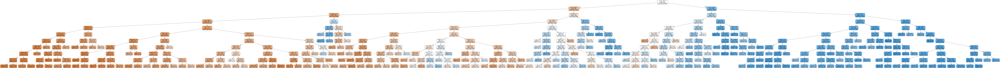

In [214]:
dot_data = StringIO()
export_graphviz(best_grid, out_file=dot_data, feature_names=features, filled=True, rounded=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

## create a less complex tree easy to visualize

In [215]:
dtree_less_complex = DecisionTreeClassifier(max_depth=3, min_samples_leaf=100, min_samples_split=50)

In [216]:
dtree_less_complex.fit(x_train, y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=3, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=100, min_samples_split=50,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

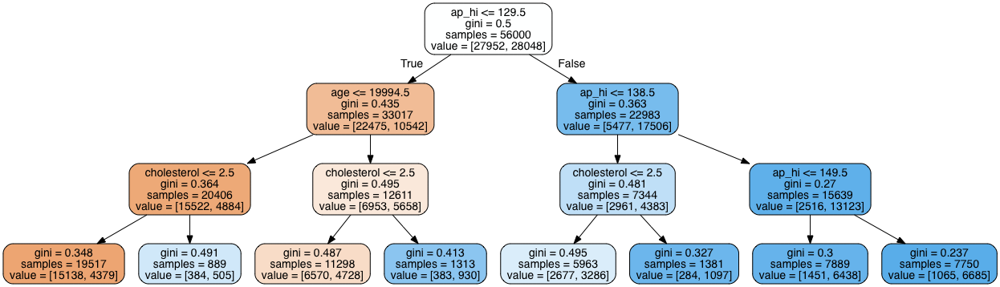

In [217]:
dot_data = StringIO()
export_graphviz(dtree_less_complex, out_file=dot_data, feature_names=features, filled=True, rounded=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

In [219]:
dtree_less_complex.score(x_test, y_test)

0.7254285714285714